<br>

# Setup.ty

```python
# The build/compilations setup
>> pip install -r requirements.txt
>> python setup.py install

```

In [1]:
import pip
import logging
import pkg_resources

try:
    from setuptools import setup
except ImportError:
    from distutils.core import setup

<br>

In [2]:
pip_ver = pkg_resources.get_distribution('pip').version
pip_ver

'21.2.4'

In [3]:
%pip --version

pip 21.2.4 from D:\Programs\Anaconda3\envs\tfg\lib\site-packages\pip (python 3.9)

Note: you may need to restart the kernel to use updated packages.


<br>

In [4]:
pip_version = list(map(int, pip_ver.split('.')[:2]))
pip_version

[21, 2]

In [5]:
pip_version >= [6, 0]

True

In [6]:
# help(pip)

In [7]:
try:
    file_path = "requirements.txt"

    raw = pip.req.parse_requirements(file_path, session=pip.download.PipSession())

    print([str(i.req) for i in raw])
    
except Exception as e:
    print(e)

module 'pip' has no attribute 'req'


<br>
<br>
<br>

# Samples

## balloon

### <font size=3 color=blue>**inspect_balloon_data.ipynb**</font>

<font size=4>**Mask R-CNN - Inspect Balloon Training Data**</font>

Inspect and visualize data loading and pre-processing code.

In [1]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon


import warnings
warnings.filterwarnings("ignore")

In [2]:
# Root directory of the project

# ROOT_DIR = os.path.abspath("../../")
# 为：'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN'
ROOT_DIR = os.path.abspath(".")
ROOT_DIR

'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13'

In [3]:
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

<br>

In [4]:
import tensorflow as tf

print(tf.__version__)

1.13.1


In [5]:
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.model import log
import mrcnn.model as modellib

from samples.balloon import balloon

%matplotlib inline 

Using TensorFlow backend.


<br>

#### <font size=3>Configurations</font>

In [6]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets\\balloon")
BALLOON_DIR

'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13\\datasets\\balloon'

<br>

#### <font size=3>Dataset</font>

In [7]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 61
Class Count: 2
  0. BG                                                
  1. balloon                                           


<br>

#### <font size=3>Display Samples</font>

Load and display images and masks.

image_ids:  [41 28 54 53]

进入 visualize.py 的 display_top_masks() 函数里的 for 循环：
np.sum() 之前的 m.shape:  (683, 1024, 2)
np.sum() 之后的 m.shape:  (683, 1024) 

np.sum() 之前的 m.shape:  (683, 1024, 0)
np.sum() 之后的 m.shape:  (683, 1024) 

np.sum() 之前的 m.shape:  (683, 1024, 0)
np.sum() 之后的 m.shape:  (683, 1024) 

np.sum() 之前的 m.shape:  (683, 1024, 0)
np.sum() 之后的 m.shape:  (683, 1024) 



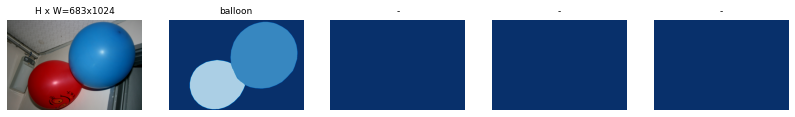


进入 visualize.py 的 display_top_masks() 函数里的 for 循环：
np.sum() 之前的 m.shape:  (1024, 683, 1)
np.sum() 之后的 m.shape:  (1024, 683) 

np.sum() 之前的 m.shape:  (1024, 683, 0)
np.sum() 之后的 m.shape:  (1024, 683) 

np.sum() 之前的 m.shape:  (1024, 683, 0)
np.sum() 之后的 m.shape:  (1024, 683) 

np.sum() 之前的 m.shape:  (1024, 683, 0)
np.sum() 之后的 m.shape:  (1024, 683) 



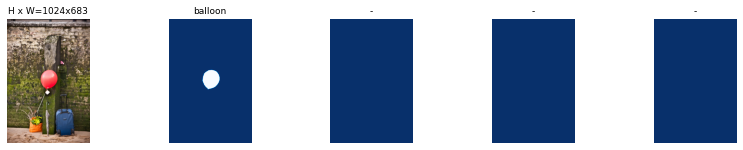


进入 visualize.py 的 display_top_masks() 函数里的 for 循环：
np.sum() 之前的 m.shape:  (768, 1024, 3)
np.sum() 之后的 m.shape:  (768, 1024) 

np.sum() 之前的 m.shape:  (768, 1024, 0)
np.sum() 之后的 m.shape:  (768, 1024) 

np.sum() 之前的 m.shape:  (768, 1024, 0)
np.sum() 之后的 m.shape:  (768, 1024) 

np.sum() 之前的 m.shape:  (768, 1024, 0)
np.sum() 之后的 m.shape:  (768, 1024) 



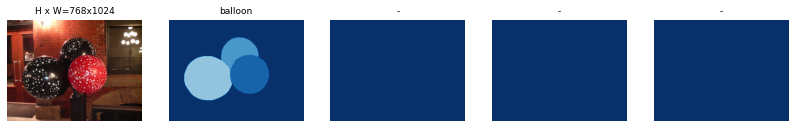


进入 visualize.py 的 display_top_masks() 函数里的 for 循环：
np.sum() 之前的 m.shape:  (852, 1024, 1)
np.sum() 之后的 m.shape:  (852, 1024) 

np.sum() 之前的 m.shape:  (852, 1024, 0)
np.sum() 之后的 m.shape:  (852, 1024) 

np.sum() 之前的 m.shape:  (852, 1024, 0)
np.sum() 之后的 m.shape:  (852, 1024) 

np.sum() 之前的 m.shape:  (852, 1024, 0)
np.sum() 之后的 m.shape:  (852, 1024) 



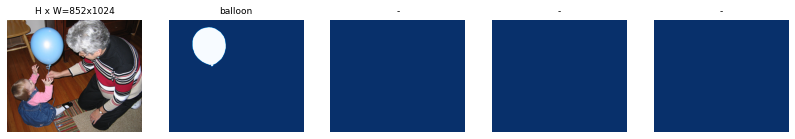

In [8]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
print("image_ids: ", image_ids)

for image_id in image_ids:
    image = dataset.load_image(image_id)
    
    mask, class_ids = dataset.load_mask(image_id)
    # 因为有时候会报错：IndexError: index 679 is out of bounds for axis 0 with size 679
    # 所以将 load_mask() 中的 mask[rr, cc, i] = 1 修改为： mask[rr-1, cc-1, i] = 1
    
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

<br>
<br>
<br>

```python
=============================================== 以下是陈锐平测试 ===============================================
```

In [9]:
image_ids = np.random.choice(dataset.image_ids, 4)
image_ids

array([22, 59, 47, 20])

In [10]:
annotations = json.load(open(os.path.join(BALLOON_DIR, "train\\via_region_data.json")))
list(annotations.keys())[:3]

['34020010494_e5cb88e1c4_k.jpg1115004',
 '25899693952_7c8b8b9edc_k.jpg814535',
 '24362039530_b151b41a52_k.jpg708540']

In [11]:
for k, v in list(annotations.values())[0].items():
    print(k, ": ", v)

fileref :  
size :  1115004
filename :  34020010494_e5cb88e1c4_k.jpg
base64_img_data :  
file_attributes :  {}
regions :  {'0': {'shape_attributes': {'name': 'polygon', 'all_points_x': [1020, 1000, 994, 1003, 1023, 1050, 1089, 1134, 1190, 1265, 1321, 1361, 1403, 1428, 1442, 1445, 1441, 1427, 1400, 1361, 1316, 1269, 1228, 1198, 1207, 1210, 1190, 1177, 1172, 1174, 1170, 1153, 1127, 1104, 1061, 1032, 1020], 'all_points_y': [963, 899, 841, 787, 738, 700, 663, 638, 621, 619, 643, 672, 720, 765, 800, 860, 896, 942, 990, 1035, 1079, 1112, 1129, 1134, 1144, 1153, 1166, 1166, 1150, 1136, 1129, 1122, 1112, 1084, 1037, 989, 963]}, 'region_attributes': {}}}


In [12]:
# list(annotations.values())[0]

In [14]:
import skimage   # 即 conda install scikit-image 所安装的库

(1024, 768, 3)


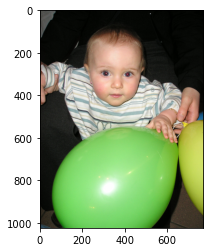

info:  {'id': '155815494_800fc9aa32_b.jpg', 'source': 'balloon', 'path': 'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13\\datasets\\balloon\\train\\155815494_800fc9aa32_b.jpg', 'width': 768, 'height': 1024, 'polygons': [{'name': 'polygon', 'all_points_x': [119, 161, 226, 278, 335, 427, 491, 543, 553, 565, 565, 578, 586, 601, 609, 625, 628, 637, 646, 648, 634, 616, 581, 520, 112, 79, 53, 64, 82, 119], 'all_points_y': [689, 645, 593, 571, 556, 544, 554, 560, 574, 577, 565, 596, 605, 605, 621, 625, 619, 628, 643, 683, 791, 884, 949, 1024, 1024, 979, 898, 813, 750, 689]}, {'name': 'polygon', 'all_points_x': [677, 656, 649, 649, 652, 670, 673, 667, 689, 692, 719, 751, 768, 766, 720, 677], 'all_points_y': [831, 758, 697, 633, 586, 554, 542, 527, 531, 537, 525, 515, 516, 970, 911, 831]}]}

len(info['polygons']):  2
i= 0
p= {'name': 'polygon', 'all_points_x': [119, 161, 226, 278, 335, 427, 491, 543, 553, 565, 565, 578, 586, 601, 609,

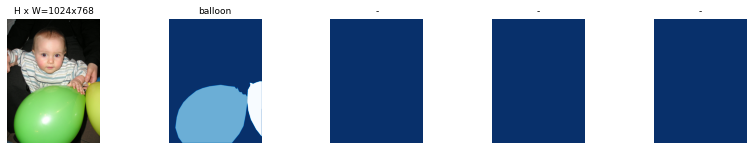

In [16]:
image_id = 55     #59
image = dataset.load_image(image_id)
print(image.shape)    # (1024, 768, 3)
plt.imshow(image)
plt.show()

info = dataset.image_info[image_id]
print("info: ", info)
print("\nlen(info['polygons']): ", len(info["polygons"]))    # 该照片中有两个气球，故有两个 polygons 的数据
# info["polygons"]


mask = np.zeros([info["height"], info["width"], len(info["polygons"])], dtype=np.uint8)
# mask.shape     # (1024, 768, 2)

for i, p in enumerate(info["polygons"]):
    rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
    print("i=", i)
    print("p=", p)
    print()
    mask[rr-1, cc-1, i] = 1

mask = mask.astype(np.bool)
class_ids = np.ones([mask.shape[-1]], dtype=np.int32)
# mask, class_ids = dataset.load_mask(image_id)
visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

In [17]:
print(class_ids)
print(np.unique(class_ids))
print()


print(np.where(class_ids == 1))
print(np.where(class_ids == 1)[0])
print()

unique_class_ids = np.unique(class_ids)
print(unique_class_ids)
print(np.where(class_ids == unique_class_ids)[0])

[1 1]
[1]

(array([0, 1], dtype=int64),)
[0 1]

[1]
[0 1]


In [18]:
# image_id = 59
image = dataset.load_image(59)


### 以下这段代码取自 balloon.py 中的 def load_mask(self, image_id): ###
info = dataset.image_info[59]     # 该张照片中有28个气球
mask = np.zeros([info["height"], info["width"], len(info["polygons"])], dtype=np.uint8)
# mask.shape    # (679, 1024, 28)

for i, p in enumerate(info["polygons"]):
    # Get indexes of pixels inside the polygon and set them to 1
    rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
    mask[rr-1, cc-1, i] = 1

mask = mask.astype(np.bool)       # 此时的 mask 的所有元素值均为 False
class_ids = np.ones([mask.shape[-1]], dtype=np.int32)
print("mask.sum(): ", mask.sum())
print()



### 以下这段代码取自 visualize.py 中的 def display_top_masks(image, mask, class_ids, class_names, limit=4): ###
unique_class_ids = np.unique(class_ids)
# unique_class_ids    # array([1])

print([np.where(class_ids == i)[0] for i in unique_class_ids])

# mask 中某一类的总面积（总像素点数）
mask_area = [np.sum(mask[:, :, np.where(class_ids == i)[0]]) for i in unique_class_ids]
print("mask_area", mask_area)  # [392001]

top_ids = [v[0] for v in sorted(zip(unique_class_ids, mask_area), 
                                key=lambda r: r[1], reverse=True) if v[1] > 0]
top_ids

mask.sum():  390761

[array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], dtype=int64)]
mask_area [390761]


[1]

In [19]:
sorted(zip([0], [1,2,3]), key=lambda r: r[1], reverse=True)

[(0, 1)]

In [20]:
# help(np.sum)

```python
================================================= 测试结束 =================================================
```

<br>

#### <font size=3>Bounding Boxes</font>

Rather than using bounding box coordinates provided by the source datasets, we compute the bounding boxes from masks instead. This allows us to handle bounding boxes consistently regardless of the source dataset, and it also makes it easier to resize, rotate, or crop images because we simply generate the bounding boxes from the updates masks rather than computing bounding box transformation for each type of image transformation.

image_id  9 D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\datasets/balloon\train\15290896925_884ab33fd3_k.jpg
image                    shape: (1356, 2048, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1356, 2048, 3)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (3,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (3, 4)                min:   42.00000  max: 1414.00000  int32


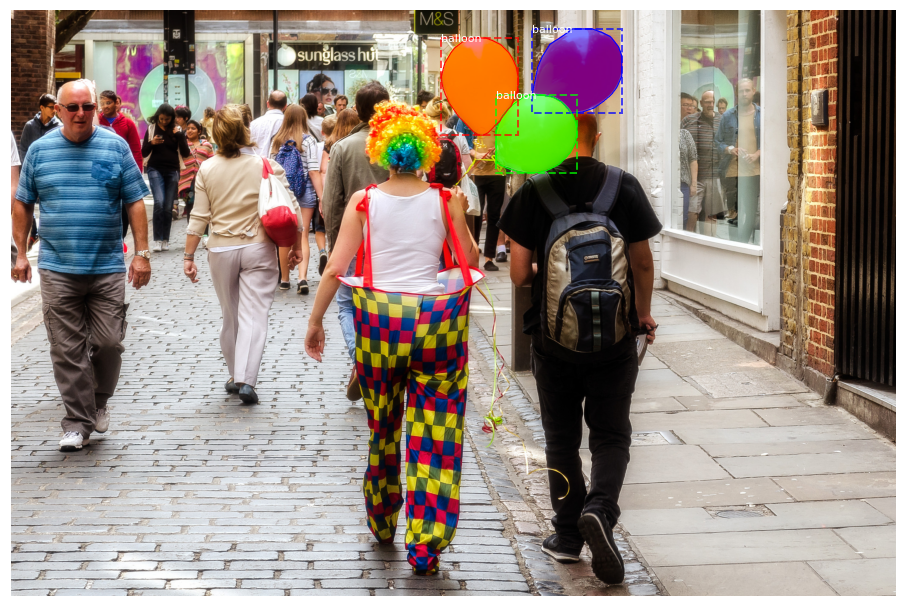

In [19]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

<br>

#### <font size=3>Resize Images</font>
<font color=maroon>To support multiple images per batch, images are resized to one size (**1024x1024**). **Aspect ratio is preserved**, though. If an image is not square, then **zero padding is added** at the top/bottom or right/left.</font>

image_id:  42 D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\datasets/balloon\train\2385899600_94b68350af_b.jpg
Original shape:  (576, 1024, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  272.00000  max:  985.00000  int32


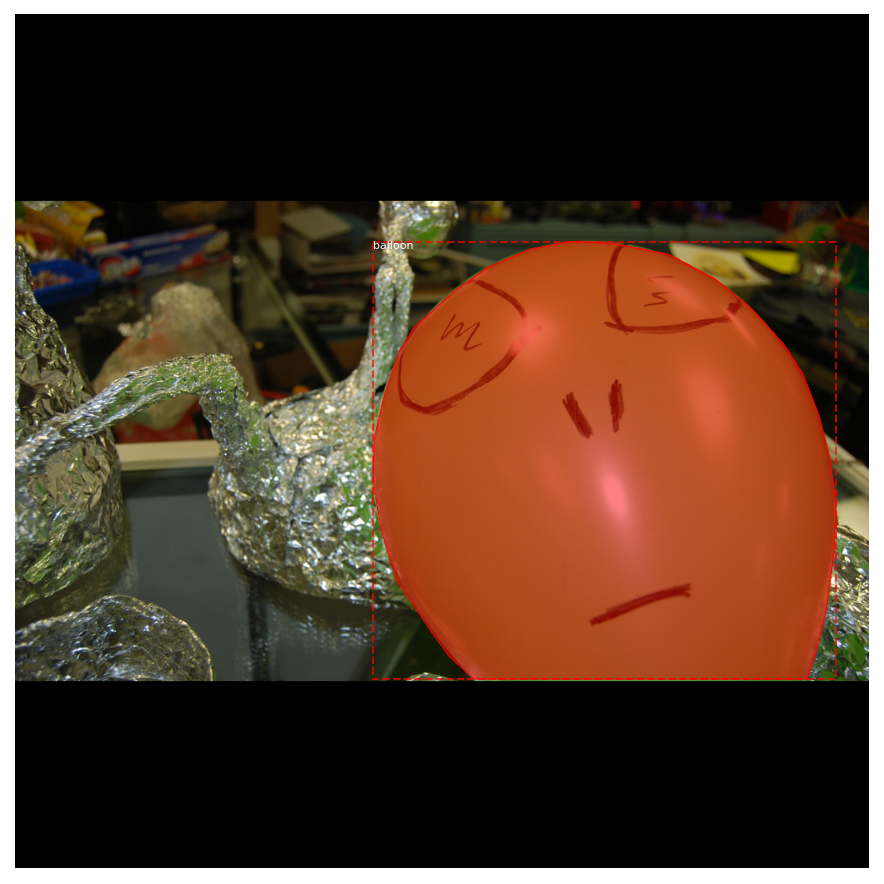

In [20]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape

# Resize
# utils.resize_image() 函数的工作：
# 先确定 scale 来 resize image, 再根据 mode 的不同来确定各种模式下 resized image 的 padding 和 window，甚至 crop，并返回。
image, window, scale, padding, _ = utils.resize_image(image, 
                                                      min_dim=config.IMAGE_MIN_DIM,    # 800
                                                      max_dim=config.IMAGE_MAX_DIM,    # 1024
                                                      mode=config.IMAGE_RESIZE_MODE    # "square"
                                                     )


mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

<br>

#### <font size=3 color=magenta>Mini Masks</font>

<font size=3><font color=maroon size=4>Instance **binary masks** can get large when training with high resolution images</font>. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (<font color=maroon>Numpy uses bytes for boolean values</font>). If an image has 100 instances then that's 100MB for the masks alone.

<font color=maroon size=4>To improve training speed, we optimize masks by:

**We store mask pixels that are inside the object bounding box, rather than a mask of the full image.**</font> Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.

<font color=maroon size=4>**We resize the mask to a smaller size (e.g. 56x56).**</font> For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accuracy to begin with, so this loss is negligable for most practical purposes. The size of the mini_mask can be set in the config class.</font>

To visualize the effect of mask resizing, and to verify the code correctness, we visualize some examples.

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (3,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (3, 4)                min:  399.00000  max:  913.00000  int32
mask                     shape: (1024, 1024, 3)       min:    0.00000  max:    1.00000  bool


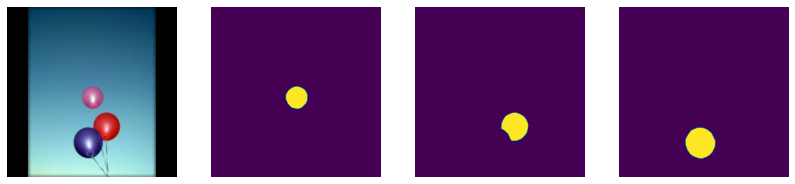

In [21]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(dataset, 
                                                                  config, 
                                                                  image_id, 
                                                                  use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

<br>

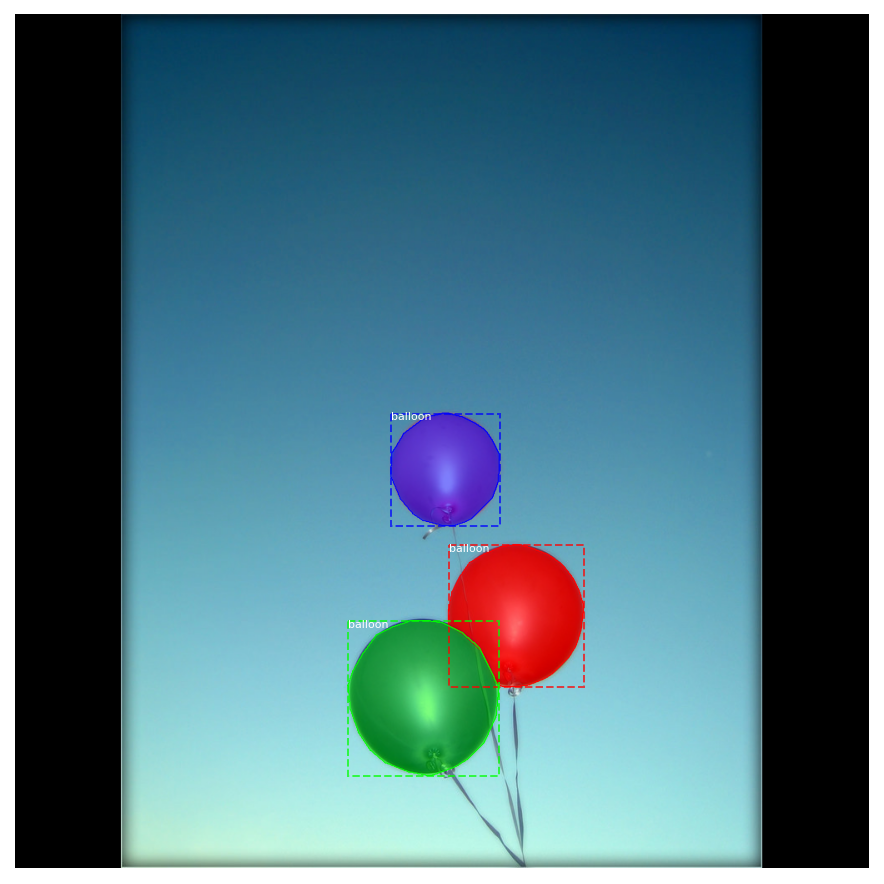

In [22]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

<br>

mask                     shape: (56, 56, 3)           min:    0.00000  max:    1.00000  bool


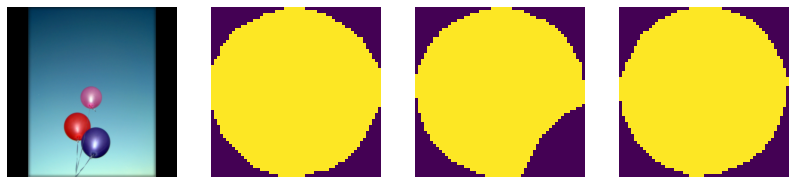

In [26]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(dataset, 
                                                                  config, 
                                                                  image_id, 
                                                                  augment=True, 
                                                                  use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

<br>

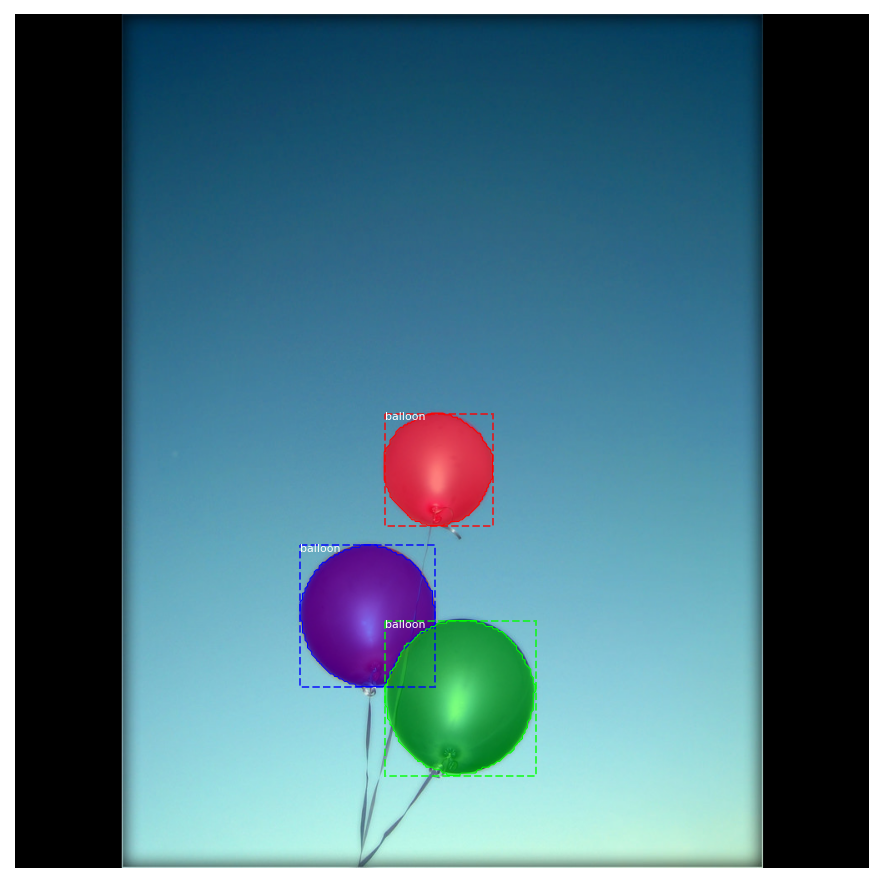

In [27]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

<br>

#### <font size=3 color=magenta>Anchors</font>

<font color=maroon size=4>**The order of anchors is important**. Use the same order in training and prediction phases. And it must match the order of the convolution execution.</font>

For an **FPN** network, <font color=maroon size=4>the anchors must be ordered</font> in a way that makes it easy to match anchors to the output of the convolution layers that <font color=maroon size=3>predict anchor scores and shifts</font>.

* <font color=maroon size=4>**Sort by pyramid level first**</font>. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, <font color=maroon size=4>**sort anchors by feature map processing sequence**</font>. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row.
* For each feature map cell, pick any sorting order for the anchors <font color=maroon size=4>**of different ratios**. Here we match the order of ratios passed to the function.</font>

<font color=maroon size=3>**Anchor Stride**:</font> In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature map of the first layer is 256x256, which generates about 200K anchors (256x256x3). These anchors are **32x32 pixels** and their **stride** <font color=maroon>relative to image **pixels**</font> is **4 pixels**, <font color=maroon>so there is a lot of **overlap**</font>. <ins>We can reduce the load significantly if we <font color=maroon size=3>generate anchors for **every other cell** in the feature map</font>. A stride of 2 will cut the number of anchors by 4, for example</ins>.

<br>


In this implementation we use **an anchor stride of 2**, which is different from the paper.

```python
BACKBONE_STRIDES = [4, 8, 16, 32, 64]
# The strides of each layer of the FPN Pyramid. These values are based on a Resnet101 backbone.


RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512)
# Length of square anchor side in pixels （平：ratio 为 1，即 anchor 为正方形时的边长。）

RPN_ANCHOR_RATIOS = [0.5, 1, 2]
# Ratios of anchors at each cell (width/height)  (平：个人觉得这里写错了，是 height/width)
# A value of 1 represents a square anchor, and 0.5 is a wide anchor.

RPN_ANCHOR_STRIDE = 1
# Anchor stride
# If 1 then anchors are created for each cell in the backbone feature map.
# If 2, then anchors are created for every other cell, and so on.

```

<br>

In [25]:
# Generate Anchors

# feature shapes, based on `config.IMAGE_SHAPE` and `config.BACKBONE_STRIDES`
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
# 根据 config.BACKBONE_STRIDES，由 config.IMAGE_SHAPE 产生 backbone_shapes (feature shapes)

anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES,  # (32, 64, 128, 256, 512)
                                         config.RPN_ANCHOR_RATIOS,  # [0.5, 1, 2]  height/width
                                         backbone_shapes,           # feature shapes 
                                         config.BACKBONE_STRIDES,   # [4, 8, 16, 32, 64]
                                         config.RPN_ANCHOR_STRIDE)  # 1


# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


<br>
<br>
<br>

```python
=============================================== 以下是陈锐平测试 ===============================================
```

In [8]:
image_shape = (1024, 1024, 3)  # config.IMAGE_SHAPE

# config.BACKBONE_STRIDES             # BACKBONE_STRIDES = [4, 8, 16, 32, 64]
feature_shapes_backbone = np.array([[int(math.ceil(image_shape[0] / stride)), 
                                     int(math.ceil(image_shape[1] / stride))]
                                    for stride in config.BACKBONE_STRIDES])
feature_shapes_backbone

array([[256, 256],
       [128, 128],
       [ 64,  64],
       [ 32,  32],
       [ 16,  16]])

In [9]:
feature_strides_pixel = config.BACKBONE_STRIDES  # [4, 8, 16, 32, 64]

rpn_anchor_scales = config.RPN_ANCHOR_SCALES     # (32, 64, 128, 256, 512)
rpn_anchor_ratios = config.RPN_ANCHOR_RATIOS     # [0.5, 1, 2]
rpn_anchor_stride = config.RPN_ANCHOR_STRIDE     # 1

In [10]:
feature_shapes_backbone[0]

array([256, 256])

In [11]:
# Anchors: [anchor_count, (y1, x1, y2, x2)]
anchors = []
# for i in range(len(rpn_anchor_scales)):
#     anchors.append(utils.generate_anchors(rpn_anchor_scales[i], rpn_anchor_ratios, 
#                                           feature_shapes_backbone[i], feature_strides_pixel[i], 
#                                           rpn_anchor_stride))

anchors.append(utils.generate_anchors(rpn_anchor_scales[0],       # 32
                                      rpn_anchor_ratios,          # [0.5, 1, 2]
                                      feature_shapes_backbone[0], # array([256, 256])
                                      feature_strides_pixel[0],   # 4
                                      rpn_anchor_stride))         # 1

print("rpn_anchor_scales[0]: ", rpn_anchor_scales[0])
print("len(anchors): ", len(anchors))
print("len(anchors[0]): ", len(anchors[0]))

assert len(anchors[0])==256*256*3

anchors

进入 `# Enumerate shifts in feature space`：
shape:  [256 256]
anchor_stride:  1
feature_stride:  4
rpn_anchor_scales[0]:  32
len(anchors):  1
len(anchors[0]):  196608


[array([[ -22.627417 ,  -11.3137085,   22.627417 ,   11.3137085],
        [ -16.       ,  -16.       ,   16.       ,   16.       ],
        [ -11.3137085,  -22.627417 ,   11.3137085,   22.627417 ],
        ...,
        [ 997.372583 , 1008.6862915, 1042.627417 , 1031.3137085],
        [1004.       , 1004.       , 1036.       , 1036.       ],
        [1008.6862915,  997.372583 , 1031.3137085, 1042.627417 ]])]

<br>
<br>

In [76]:
feature_shapes_backbone[1]

array([128, 128])

In [77]:
# Anchors: [anchor_count, (y1, x1, y2, x2)]
anchors = []
# for i in range(len(rpn_anchor_scales)):
#     anchors.append(utils.generate_anchors(rpn_anchor_scales[i], rpn_anchor_ratios, 
#                                           feature_shapes_backbone[i], feature_strides_pixel[i], 
#                                           rpn_anchor_stride))

anchors.append(utils.generate_anchors(rpn_anchor_scales[1],       # 64
                                      rpn_anchor_ratios,          # [0.5, 1, 2]
                                      feature_shapes_backbone[1], # array([128, 128])
                                      feature_strides_pixel[1],   # 4
                                      rpn_anchor_stride))         # 1

print("rpn_anchor_scales[1]: ", rpn_anchor_scales[1])
print("len(anchors): ", len(anchors))
print("len(anchors[0]): ", len(anchors[0]))

assert len(anchors[0])==128*128*3

anchors

rpn_anchor_scales[1]:  64
len(anchors):  1
len(anchors[0]):  49152


[array([[ -45.254834,  -22.627417,   45.254834,   22.627417],
        [ -32.      ,  -32.      ,   32.      ,   32.      ],
        [ -22.627417,  -45.254834,   22.627417,   45.254834],
        ...,
        [ 970.745166,  993.372583, 1061.254834, 1038.627417],
        [ 984.      ,  984.      , 1048.      , 1048.      ],
        [ 993.372583,  970.745166, 1038.627417, 1061.254834]])]

<br>
<br>

In [78]:
anchors = []
for i in range(len(rpn_anchor_scales)):
    anchors.append(utils.generate_anchors(rpn_anchor_scales[i], 
                                          rpn_anchor_ratios, 
                                          feature_shapes_backbone[i], 
                                          feature_strides_pixel[i], 
                                          rpn_anchor_stride))
    
    print("step {}, len(anchors) = {} ".format(i, len(anchors)))
    print("len(anchors[{}]): {}".format(i, len(anchors[i])))
    print()

step 0, len(anchors) = 1 
len(anchors[0]): 196608

step 1, len(anchors) = 2 
len(anchors[1]): 49152

step 2, len(anchors) = 3 
len(anchors[2]): 12288

step 3, len(anchors) = 4 
len(anchors[3]): 3072

step 4, len(anchors) = 5 
len(anchors[4]): 768



<br>
<br>

以下试验代码来自 utils.py 的 *`def generate_anchors()`*。

In [25]:
# rpn_anchor_scales[0]:   32
# rpn_anchor_ratios:      [0.5 1.  2. ]
s, r = np.meshgrid(np.array(rpn_anchor_scales[0]), np.array(rpn_anchor_ratios))
print("s:\n", s)
print()
print("r:\n", r)
print()

s = s.flatten()
r = r.flatten()
print("s:\n", s)
print()
print("r:\n", r)

s:
 [[32]
 [32]
 [32]]

r:
 [[0.5]
 [1. ]
 [2. ]]

s:
 [32 32 32]

r:
 [0.5 1.  2. ]


In [26]:
# Enumerate heights and widths from scales and ratios
h = s / np.sqrt(r)   # [45.254834 32.       22.627417]
w = s * np.sqrt(r)   # [22.627417 32.       45.254834]

# print("    ".join(h))   # 会报错：TypeError: sequence item 0: expected str instance, numpy.float64 found
print("h: " + "    ".join(map(str, h)))
print("w: " + "    ".join(map(str, w)))


h: 45.25483399593904    32.0    22.62741699796952
w: 22.627416997969522    32.0    45.254833995939045


<br>

In [27]:
feature_shapes_backbone[0][0]

rpn_anchor_stride

1

In [28]:
feature_strides_pixel

[4, 8, 16, 32, 64]

In [29]:
# Enumerate shifts in feature space
shifts_y = np.arange(0, feature_shapes_backbone[0][0], rpn_anchor_stride) * feature_strides_pixel[0]
shifts_x = np.arange(0, feature_shapes_backbone[0][1], rpn_anchor_stride) * feature_strides_pixel[0]
print(shifts_y, "\n")
# print(shifts_x, "\n")

shifts_x, shifts_y = np.meshgrid(shifts_x, shifts_y)

[   0    4    8   12   16   20   24   28   32   36   40   44   48   52
   56   60   64   68   72   76   80   84   88   92   96  100  104  108
  112  116  120  124  128  132  136  140  144  148  152  156  160  164
  168  172  176  180  184  188  192  196  200  204  208  212  216  220
  224  228  232  236  240  244  248  252  256  260  264  268  272  276
  280  284  288  292  296  300  304  308  312  316  320  324  328  332
  336  340  344  348  352  356  360  364  368  372  376  380  384  388
  392  396  400  404  408  412  416  420  424  428  432  436  440  444
  448  452  456  460  464  468  472  476  480  484  488  492  496  500
  504  508  512  516  520  524  528  532  536  540  544  548  552  556
  560  564  568  572  576  580  584  588  592  596  600  604  608  612
  616  620  624  628  632  636  640  644  648  652  656  660  664  668
  672  676  680  684  688  692  696  700  704  708  712  716  720  724
  728  732  736  740  744  748  752  756  760  764  768  772  776  780
  784 

<br>

In [44]:
print("shifts_x:", shifts_x.shape, "\n", shifts_x, "\n")

print("shifts_y:", shifts_y.shape, "\n", shifts_y, "\n")

shifts_x: (256, 256) 
 [[   0    4    8 ... 1012 1016 1020]
 [   0    4    8 ... 1012 1016 1020]
 [   0    4    8 ... 1012 1016 1020]
 ...
 [   0    4    8 ... 1012 1016 1020]
 [   0    4    8 ... 1012 1016 1020]
 [   0    4    8 ... 1012 1016 1020]] 

shifts_y: (256, 256) 
 [[   0    0    0 ...    0    0    0]
 [   4    4    4 ...    4    4    4]
 [   8    8    8 ...    8    8    8]
 ...
 [1012 1012 1012 ... 1012 1012 1012]
 [1016 1016 1016 ... 1016 1016 1016]
 [1020 1020 1020 ... 1020 1020 1020]] 



<br>

In [43]:
print("shifts_x[0] * shifts_x[1]: {}\n".format(np.product(shifts_x.shape), "\n"))

# Enumerate combinations of shifts, widths, and heights
box_widths, box_centers_x = np.meshgrid(w, shifts_x)   # 相当于先对 shifts_x 进行 flatten，再进行 meshgrid。
box_heights, box_centers_y = np.meshgrid(h, shifts_y)  # 同上。

shifts_x[0] * shifts_x[1]: 65536



In [45]:
print("box_widths: ", box_widths.shape, "\n", box_widths, "\n")

print("box_centers_x: ", box_centers_x.shape, "\n", box_centers_x, "\n")

box_widths:  (65536, 3) 
 [[22.627417 32.       45.254834]
 [22.627417 32.       45.254834]
 [22.627417 32.       45.254834]
 ...
 [22.627417 32.       45.254834]
 [22.627417 32.       45.254834]
 [22.627417 32.       45.254834]] 

box_centers_x:  (65536, 3) 
 [[   0    0    0]
 [   4    4    4]
 [   8    8    8]
 ...
 [1012 1012 1012]
 [1016 1016 1016]
 [1020 1020 1020]] 



<br>

```python
# Reshape to get a list of (y, x) and a list of (h, w)
```

In [48]:
[box_centers_y, box_centers_x]    # [(65536, 3), (65536, 3) ]

[array([[   0,    0,    0],
        [   0,    0,    0],
        [   0,    0,    0],
        ...,
        [1020, 1020, 1020],
        [1020, 1020, 1020],
        [1020, 1020, 1020]]), array([[   0,    0,    0],
        [   4,    4,    4],
        [   8,    8,    8],
        ...,
        [1012, 1012, 1012],
        [1016, 1016, 1016],
        [1020, 1020, 1020]])]

In [50]:
print(np.stack([box_centers_y, box_centers_x], axis=2).shape)

np.stack([box_centers_y, box_centers_x], axis=2)

(65536, 3, 2)


array([[[   0,    0],
        [   0,    0],
        [   0,    0]],

       [[   0,    4],
        [   0,    4],
        [   0,    4]],

       [[   0,    8],
        [   0,    8],
        [   0,    8]],

       ...,

       [[1020, 1012],
        [1020, 1012],
        [1020, 1012]],

       [[1020, 1016],
        [1020, 1016],
        [1020, 1016]],

       [[1020, 1020],
        [1020, 1020],
        [1020, 1020]]])

In [51]:
box_centers = np.stack([box_centers_y, box_centers_x], axis=2).reshape([-1, 2])
print(box_centers.shape)
box_centers

(196608, 2)


array([[   0,    0],
       [   0,    0],
       [   0,    0],
       ...,
       [1020, 1020],
       [1020, 1020],
       [1020, 1020]])

<br>
<br>

In [52]:
[box_heights, box_widths]    # [(65536, 3), (65536, 3) ]

[array([[45.254834, 32.      , 22.627417],
        [45.254834, 32.      , 22.627417],
        [45.254834, 32.      , 22.627417],
        ...,
        [45.254834, 32.      , 22.627417],
        [45.254834, 32.      , 22.627417],
        [45.254834, 32.      , 22.627417]]),
 array([[22.627417, 32.      , 45.254834],
        [22.627417, 32.      , 45.254834],
        [22.627417, 32.      , 45.254834],
        ...,
        [22.627417, 32.      , 45.254834],
        [22.627417, 32.      , 45.254834],
        [22.627417, 32.      , 45.254834]])]

In [54]:
print(np.stack([box_heights, box_widths], axis=2).shape)

np.stack([box_heights, box_widths], axis=2)

(65536, 3, 2)


array([[[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]],

       [[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]],

       [[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]],

       ...,

       [[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]],

       [[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]],

       [[45.254834, 22.627417],
        [32.      , 32.      ],
        [22.627417, 45.254834]]])

In [55]:
box_sizes = np.stack([box_heights, box_widths], axis=2).reshape([-1, 2])
print(box_sizes.shape)
box_sizes

(196608, 2)


array([[45.254834, 22.627417],
       [32.      , 32.      ],
       [22.627417, 45.254834],
       ...,
       [45.254834, 22.627417],
       [32.      , 32.      ],
       [22.627417, 45.254834]])

<br>
<br>

```python
# Convert to corner coordinates (y1, x1, y2, x2)
```

In [58]:
print((box_centers - 0.5 * box_sizes).shape)

[box_centers - 0.5 * box_sizes, box_centers + 0.5 * box_sizes]

(196608, 2)


[array([[ -22.627417 ,  -11.3137085],
        [ -16.       ,  -16.       ],
        [ -11.3137085,  -22.627417 ],
        ...,
        [ 997.372583 , 1008.6862915],
        [1004.       , 1004.       ],
        [1008.6862915,  997.372583 ]]), array([[  22.627417 ,   11.3137085],
        [  16.       ,   16.       ],
        [  11.3137085,   22.627417 ],
        ...,
        [1042.627417 , 1031.3137085],
        [1036.       , 1036.       ],
        [1031.3137085, 1042.627417 ]])]

In [59]:
boxes = np.concatenate([box_centers - 0.5 * box_sizes, box_centers + 0.5 * box_sizes], axis=1)
print(boxes.shape)
boxes

(196608, 4)


array([[ -22.627417 ,  -11.3137085,   22.627417 ,   11.3137085],
       [ -16.       ,  -16.       ,   16.       ,   16.       ],
       [ -11.3137085,  -22.627417 ,   11.3137085,   22.627417 ],
       ...,
       [ 997.372583 , 1008.6862915, 1042.627417 , 1031.3137085],
       [1004.       , 1004.       , 1036.       , 1036.       ],
       [1008.6862915,  997.372583 , 1031.3137085, 1042.627417 ]])

```python
================================================== 测试结束 ==================================================
```

<br>
<br>
<br>

Visualize anchors of one cell at the center of the feature map of a specific level.

```python
compose_image_meta(image_id, original_shape, image.shape, window, scale, active_class_ids)

# 上述函数 compose_image_meta() 的返回值为：
meta = np.array([image_id] +                   # size=1
                 list(original_image_shape) +  # size=3
                 list(image_shape) +           # size=3
                 list(window) +                # size=4 (y1, x1, y2, x2) in image coordinates
                 [scale] +                     # size=1
                 list(active_class_ids)        # size=num_classes
                )
```

Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


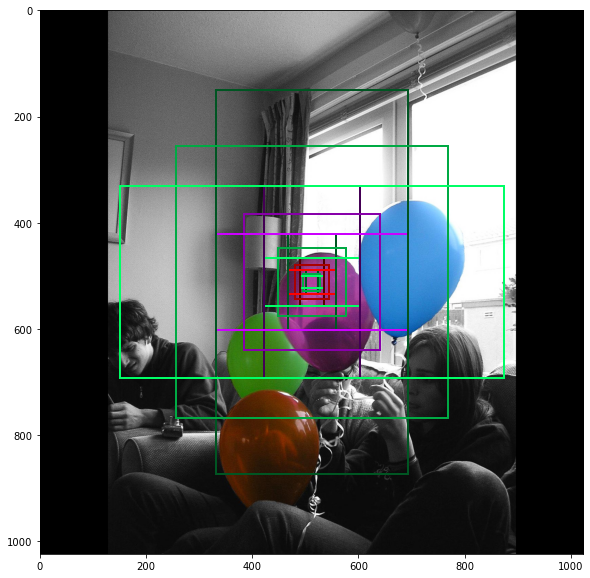

In [26]:
# Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)


for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level])   # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, 
                                                                  level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2             # 中心像素点的坐标
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])  # 定位到中心像素点
    level_center = center_cell_index * anchors_per_cell   # 定位到中心像素点的起始 anchor
    center_anchor = anchors_per_cell * ((center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
                                         + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)                     # 定位到中心像素点的起始 anchor

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\datasets/balloon\train\5674044810_2d9e2243ff_b.jpg


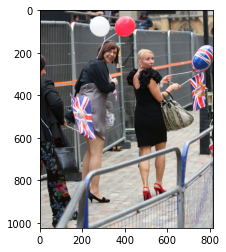

In [27]:
# 陈锐平 try
image_id = 25   # 25
info = dataset.image_reference(image_id)
print(info)

img = dataset.load_image(image_id)
plt.imshow(img)
plt.show()

<br>

<font size=3>Data Generator</font>

In [28]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(dataset, 
                            config, 
                            shuffle=True, 
                            random_rois=random_rois, 
                            batch_size=4,
                            detection_targets=True)

In [29]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [30]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, 
     gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] \
    = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast i

rois                     shape: (4, 200, 4)           min:    1.00000  max: 1023.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (4, 200, 2, 4)        min:   -3.25881  max:    2.99180  float32
mrcnn_mask               shape: (4, 200, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 100)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (4, 100, 4)           min:    0.00000  max:  997.00000  int32
gt_masks                 shape: (4, 56, 56, 100)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 261888, 1)        min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 256, 4)           min:   -4.14320  max:    3.29665  float64
image_id:  3 D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\datasets/balloon\train\18849792632

<br>

anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (35, 4)               min:  183.00000  max:  786.99994  float32
Positive anchors: 35
Negative anchors: 221
Neutral anchors: 261632
BG                     : 134
balloon                : 66


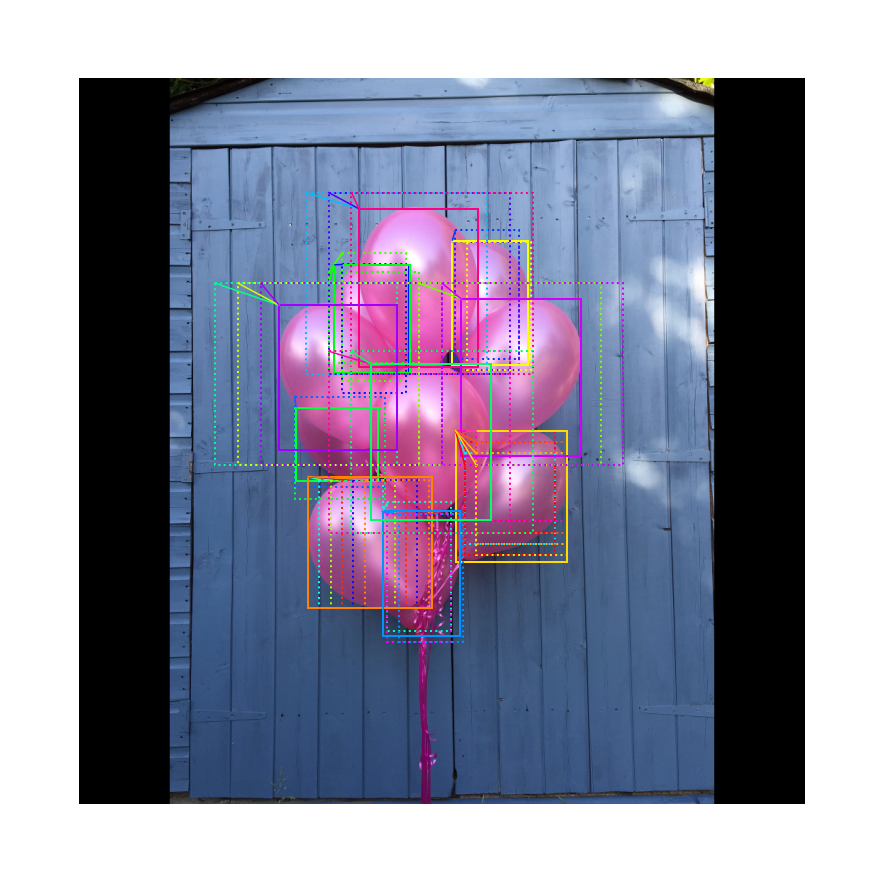

In [31]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))


# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

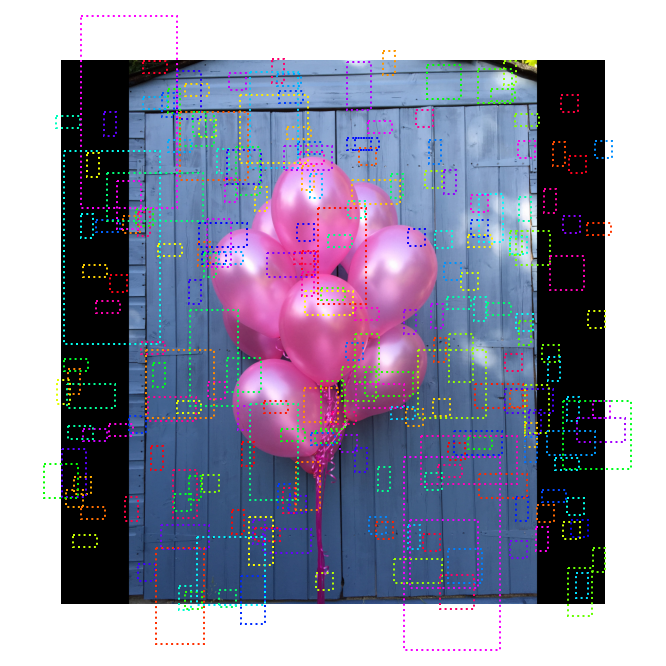

In [32]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

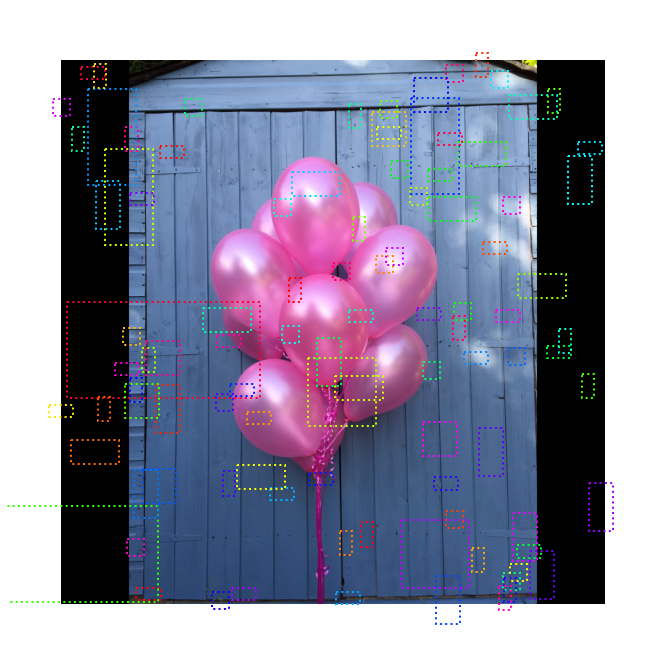

In [33]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

#### <font size=3>ROIs</font>

Positive ROIs:  66
Negative ROIs:  134
Positive Ratio: 0.33
Unique ROIs: 200 out of 200


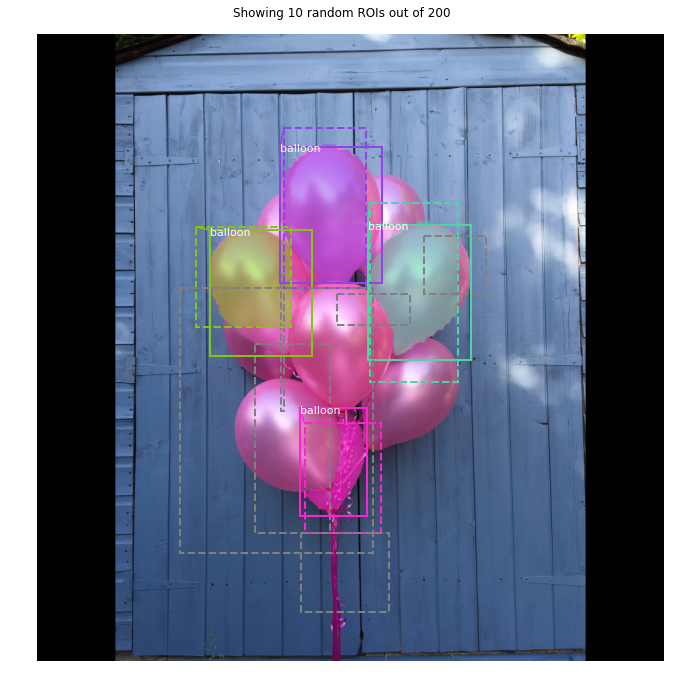

In [34]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

<br>

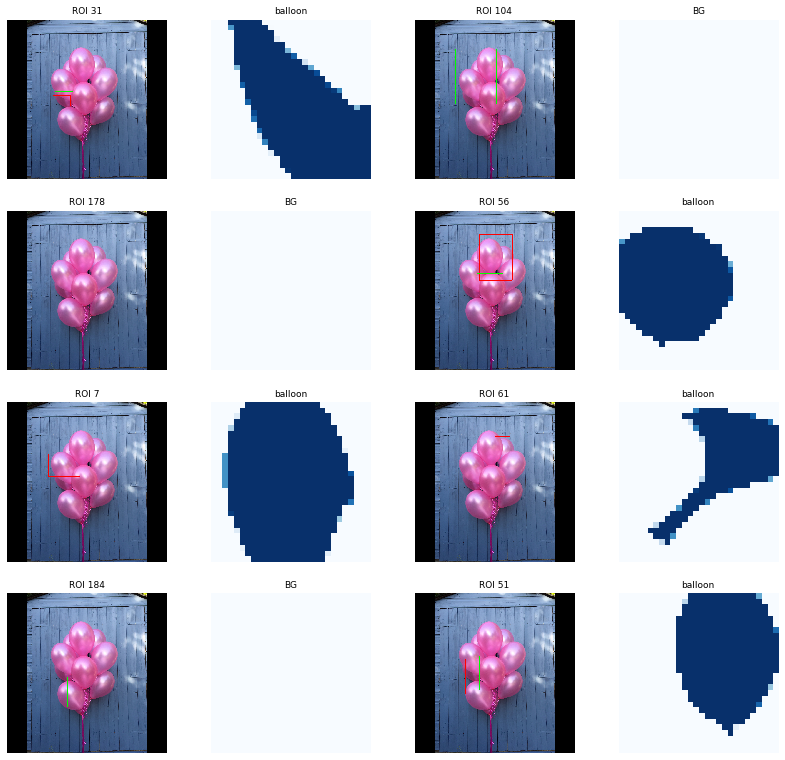

In [35]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

<br>

In [36]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33


D:\Programs\Anaconda3\envs\tf13\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
Average percent: 0.33


<br>
<br>
<br>

### <font size=3 color=blue>**inspect_balloon_model.ipynb**</font>

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
import os
import sys
# import itertools
import math
# import logging
# import json
import re
import random
import time
# from collections import OrderedDict

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# import matplotlib.lines as lines
# from matplotlib.patches import Polygon


import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
print(tf.__version__)

1.13.1


<br>

In [3]:
# Root directory of the project

# ROOT_DIR = os.path.abspath("../../")
# 为：'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN'
ROOT_DIR = os.path.abspath(".")
ROOT_DIR

'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13'

In [4]:
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

In [5]:
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.model import log
import mrcnn.model as modellib

from samples.balloon import balloon

%matplotlib inline

Using TensorFlow backend.


In [6]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")    # 如果 logs 文件夹不存在，则需要创建。

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
# BALLON_WEIGHTS_PATH = "/path/to/mask_rcnn_balloon.h5"  # TODO: update this path
BALLON_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_balloon.h5")
BALLON_WEIGHTS_PATH

'D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13\\mask_rcnn_balloon.h5'

<br>
<br>

#### <font size=3>Configurations</font>

In [7]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/balloon")

In [8]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

<br>

#### <font size=3>Notebook Preferences</font>

In [9]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [10]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

<br>
<br>

#### <font size=3>Load Validation Dataset</font>

In [11]:
# Load validation dataset
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), 
                                       dataset.class_names))

Images: 13
Classes: ['BG', 'balloon']


<br>

#### <font size=3>Load Model</font>

In [12]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", 
                              model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


<br>

In [13]:
# 平 try
print(MODEL_DIR)   # 需要创建 logs 文件夹
print()
print(type(os.walk(MODEL_DIR)))
print()
print(list(os.walk(MODEL_DIR)))

next(os.walk(MODEL_DIR))[1]

D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\logs

<class 'generator'>

[('D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13\\logs', ['balloon'], []), ('D:\\KeepStudy\\0_Coding\\DL Moldels Implementation\\MRCNN\\matterport - Mask_RCNN\\My_implementation_tf1-13\\logs\\balloon', [], ['mask_rcnn_balloon.h5'])]


['balloon']

<br>

In [14]:
# Set path to balloon weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases
# weights_path = "/path/to/mask_rcnn_balloon.h5"

# Or, load the last model you trained
weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\logs\balloon\mask_rcnn_balloon.h5


<br>

#### <font size=3>Run Detection</font>

In [15]:
# model.keras_model.trainable   # True

In [16]:
# model.keras_model.trainable = False
# model.keras_model.trainable   # False

2
image ID: balloon.14898532020_ba6199dd22_k.jpg (2) D:\KeepStudy\0_Coding\DL Moldels Implementation\MRCNN\matterport - Mask_RCNN\My_implementation_tf1-13\datasets/balloon\val\14898532020_ba6199dd22_k.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (9,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (9, 4)                min:   11.00000  max: 1009.00000  int32
gt_mask                  shape: (1024, 1024, 9)       min:    0.00000  max:    1.00000  bool


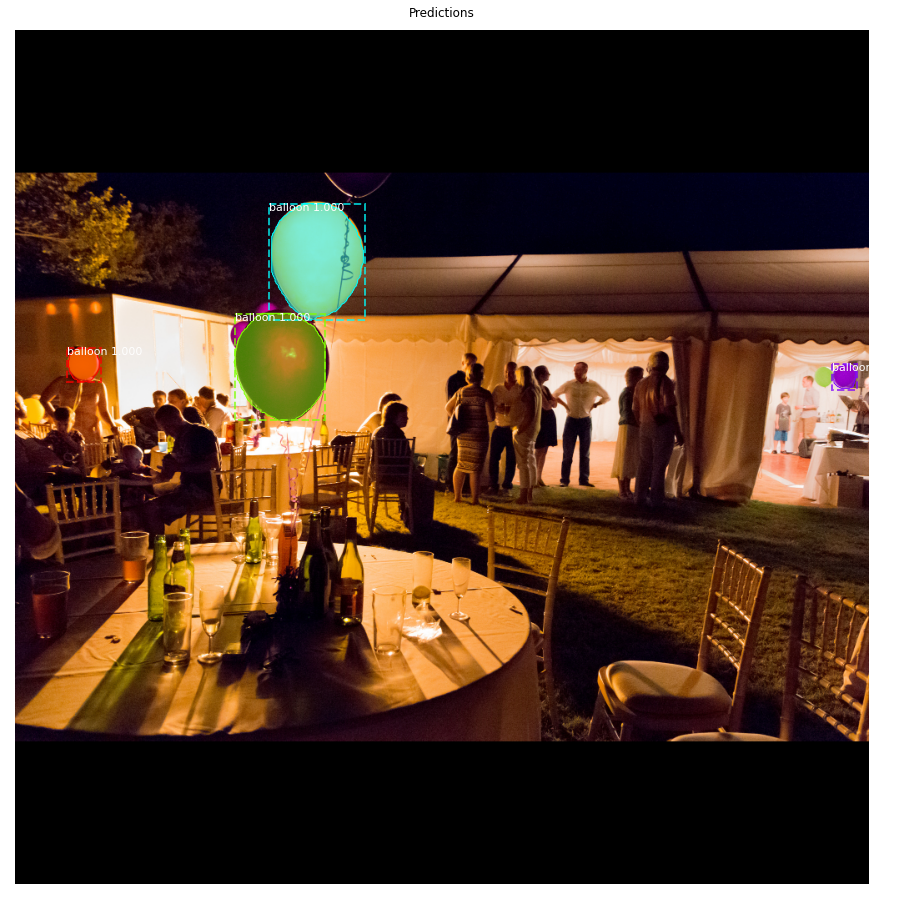

In [17]:
image_id = 2     # random.choice(dataset.image_ids)
print(image_id)

image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

<br>

#### <font size=3>Color Splash</font>

This is for illustration. You can call balloon.py with the splash option to get better images without the black padding.

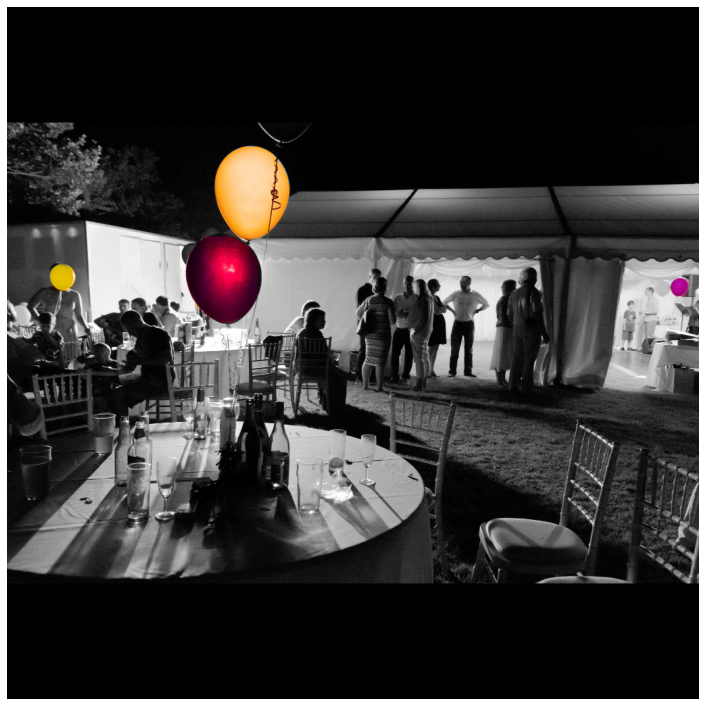

In [18]:
splash = balloon.color_splash(image, r['masks'])
display_images([splash], cols=1)

<br>

#### <font size=3 color=maroon>Step by Step Prediction</font>

即以下 2.1.2.8 开始的内容。

#### <font size=3>**Stage 1**: Region Proposal Network</font>

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. <font color=maroon>Anchors with high objectness score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.</font>

#### <font size=3>1.a RPN Targets</font>

<font color=maroon>The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object.</font> **Positive anchors** are those that have an IoU >= 0.7 with any ground truth object, and **negative anchors** are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered **neutral** <font color=maroon>and excluded from training</font>.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [19]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -2.05556  max:    1.32583  float64
positive_anchors         shape: (26, 4)               min:    8.00000  max: 1012.00000  float64
negative_anchors         shape: (230, 4)              min:  -37.25483  max: 1082.50967  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (26, 4)               min:   11.00000  max: 1009.00000  float32


<br>

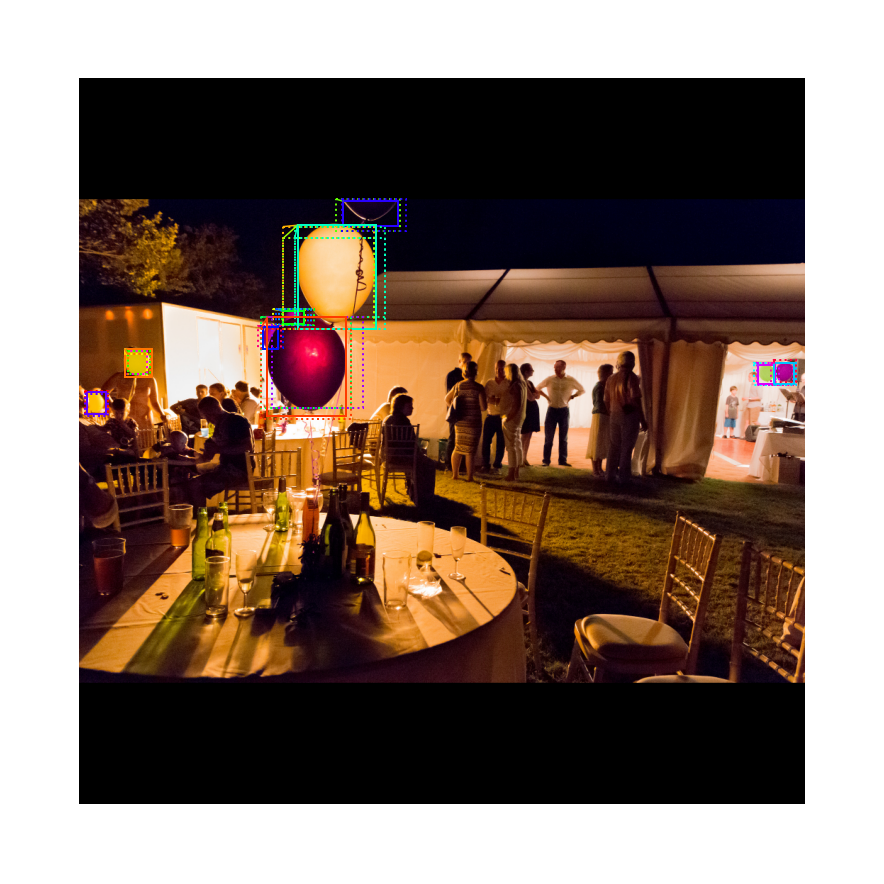

In [20]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, 
                     boxes=positive_anchors, 
                     refined_boxes=refined_anchors, 
                     ax=get_ax())

<br>

#### <font size=3>1.b RPN Predictions</font>

Here we run the RPN graph and display its predictions.

In [21]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

# Build a Keras function to run parts of the computation graph

type(model) <class 'keras.engine.training.Model'>
model.trainable:  True
model.uses_learning_phase:  False
type(model.uses_learning_phase):  <class 'bool'>
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

inputs:  [<tf.Tensor 'input_image:0' shape=(?, ?, ?, 3) dtype=float32>, <tf.Tensor 'input_image_meta:0' shape=(?, 14) dtype=float32>, <tf.Tensor 'input_anchors:0' shape=(?, ?, 4) dtype=float32>]


# Run inference

model.trainable:  True
model.uses_learning_phase:  False
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

type(model_in):  <class 'list'>
len(model_in):  3
model_in[0].shape:  (1, 1024, 1024, 3)
model_in[1].shape:  (1, 14)
model_in[2].shape:  (1, 261888, 4)



rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.12512  float32
refined_

<br>

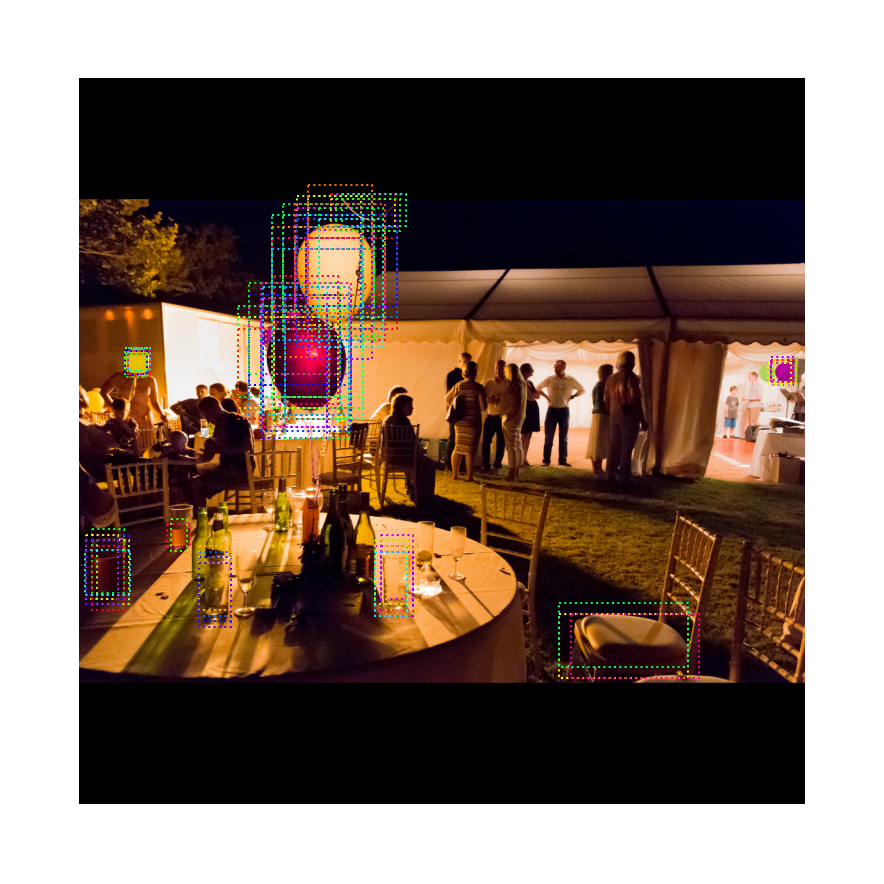

In [22]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

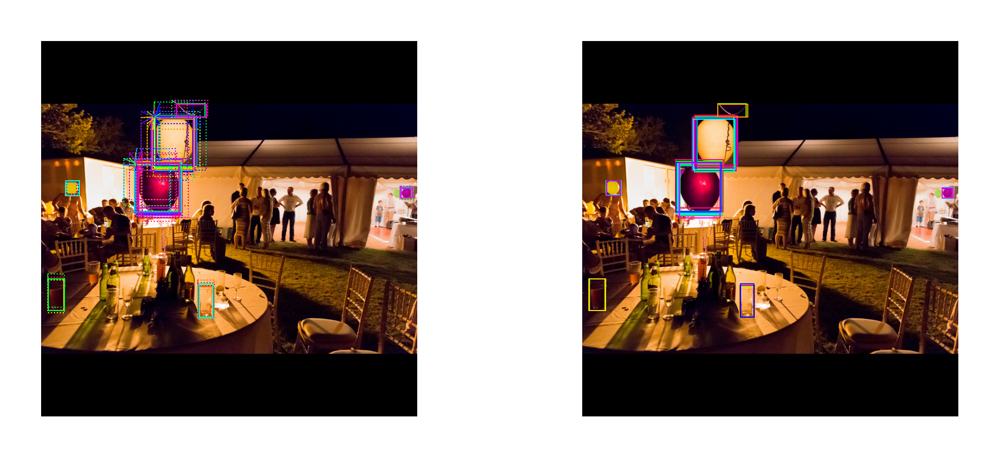

In [23]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

<br>

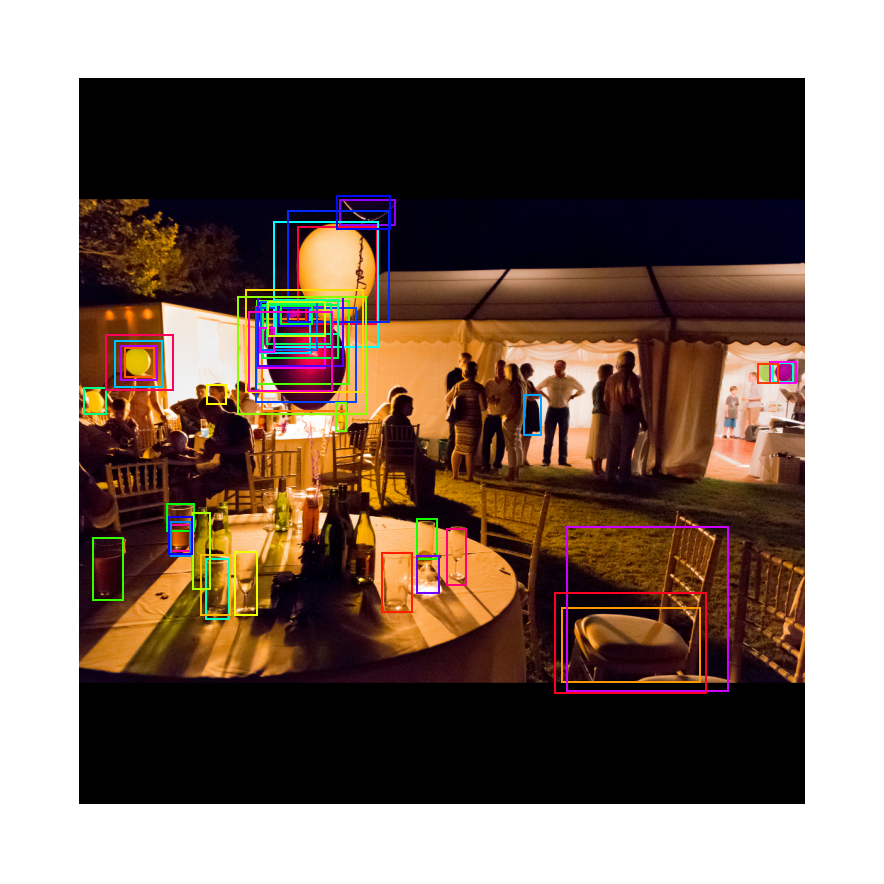

In [24]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

<br>

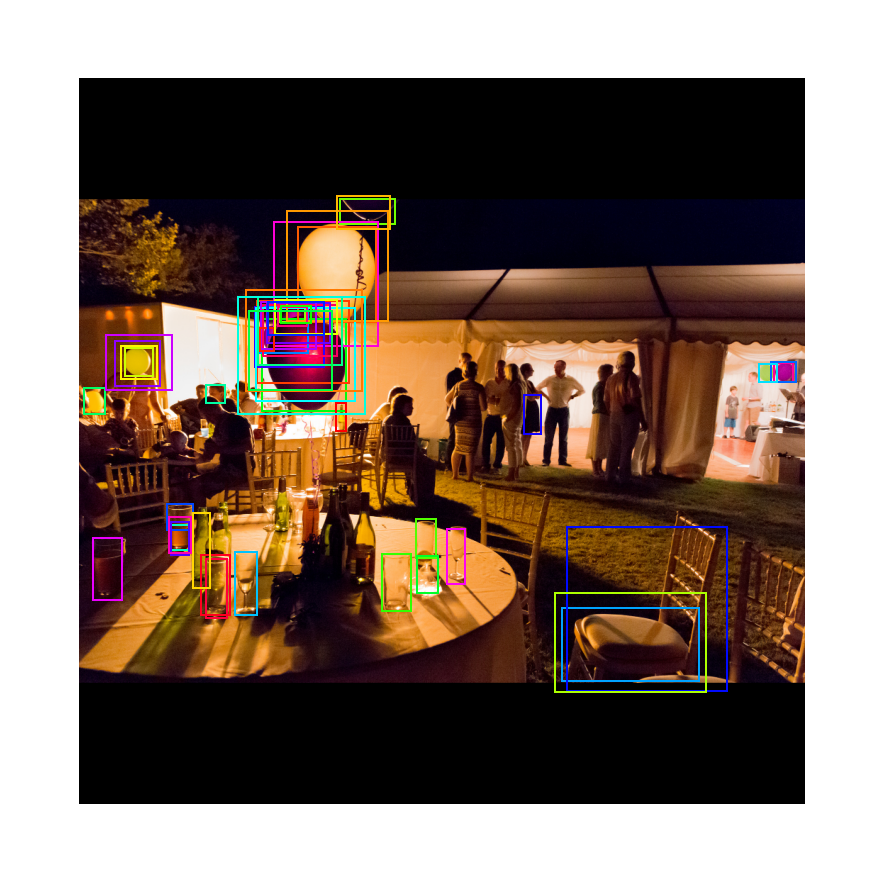

In [25]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

<br>
<br>
<br>

#### <font size=3>**Stage 2**: Proposal Classification</font>

This stage takes the region proposals from the RPN and classifies them.

<br>

#### <font size=3>2.a Proposal Classification</font>

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [26]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

# Build a Keras function to run parts of the computation graph

type(model) <class 'keras.engine.training.Model'>
model.trainable:  True
model.uses_learning_phase:  False
type(model.uses_learning_phase):  <class 'bool'>
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

inputs:  [<tf.Tensor 'input_image:0' shape=(?, ?, ?, 3) dtype=float32>, <tf.Tensor 'input_image_meta:0' shape=(?, 14) dtype=float32>, <tf.Tensor 'input_anchors:0' shape=(?, ?, 4) dtype=float32>]


# Run inference

model.trainable:  True
model.uses_learning_phase:  False
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

type(model_in):  <class 'list'>
len(model_in):  3
model_in[0].shape:  (1, 1024, 1024, 3)
model_in[1].shape:  (1, 14)
model_in[2].shape:  (1, 261888, 4)



proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas  

<br>

4 detections: ['balloon' 'balloon' 'balloon' 'balloon']


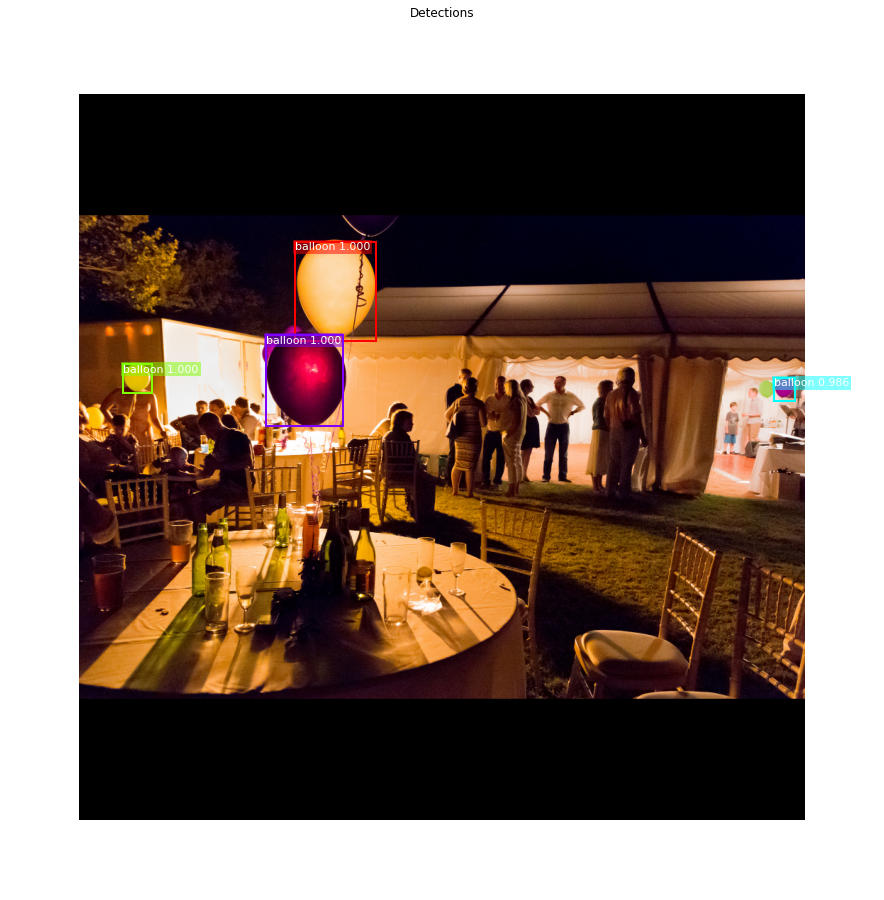

In [27]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

<br>
<br>

#### <font size=3>2.b Step by Step Detection</font>

Here we dive deeper into the process of processing the detections.

In [28]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
26 Positive ROIs
[('BG', 974), ('balloon', 26)]


<br>
<br>

#### <font size=3>Apply Bounding Box Refinement</font>

roi_bbox_specific        shape: (1000, 4)             min:   -4.24207  max:    3.74202  float32
refined_proposals        shape: (1000, 4)             min: -329.00000  max: 1253.00000  int32


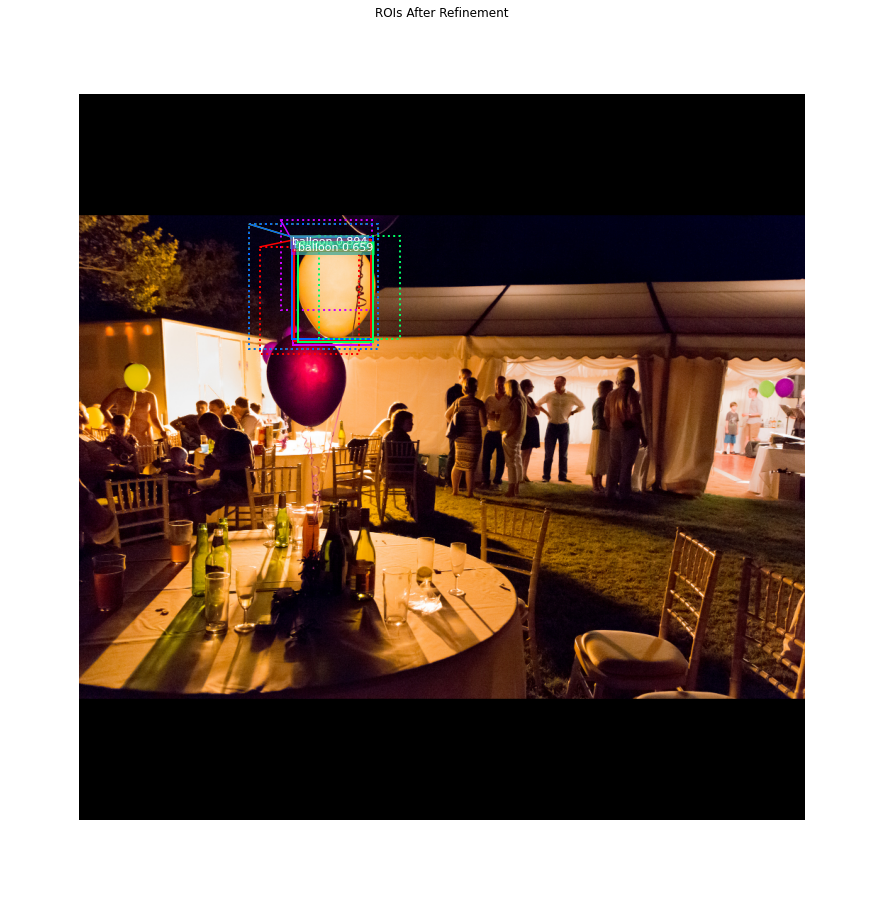

In [29]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### <font size=3>Filter Low Confidence Detections</font>

In [30]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 26 detections:
[  0   1   4   5   9  10  13  16  20  22  48  49  72  74  83  86  88 148
 164 172 273 358 655 719 772 881]


In [31]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 19:
[  0   1   4   5   9  10  13  16  20  22  49  72  74  86  88 172 358 655
 719]


<br>
<br>

#### <font size=3>Per-Class Non-Max Suppression</font>

In [32]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

balloon               : [  0   1   4   5   9  10  13  16  20  22  49  72  74  86  88 172 358 655
 719] -> [1 5 0 4]

Kept after per-class NMS: 4
[0 1 4 5]


<br>

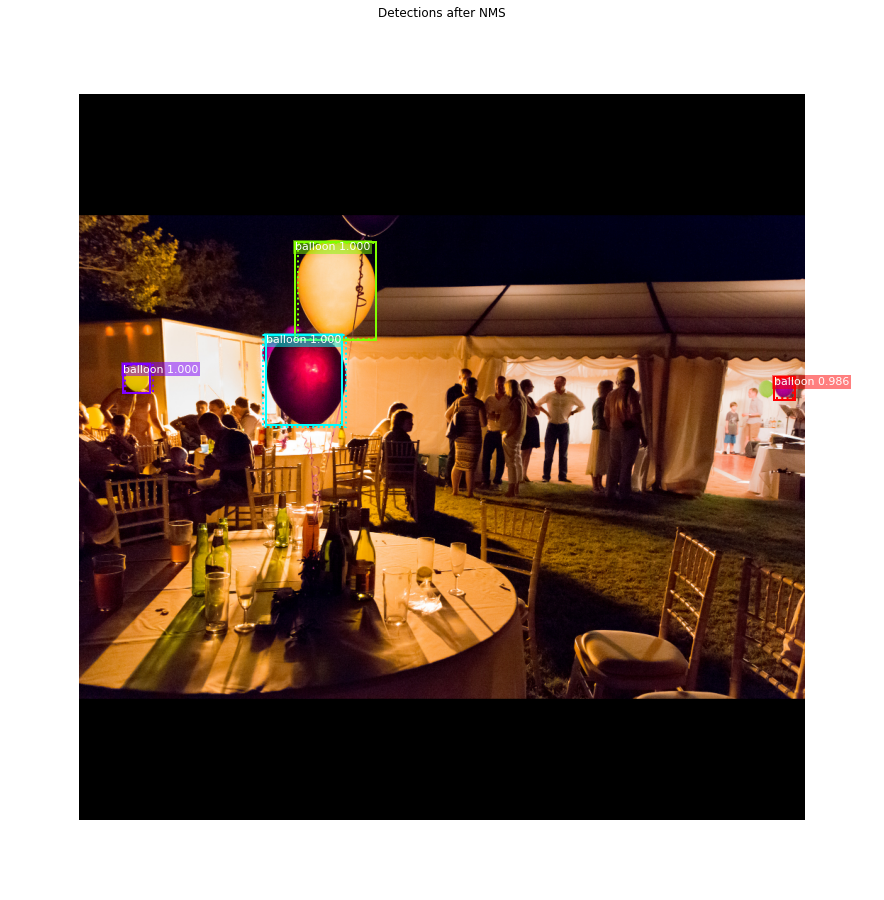

In [33]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

<br>
<br>
<br>

#### <font size=3>**Stage 3**: Generating Masks</font>

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

<br>

#### <font size=3>3.a Mask Targets</font>

These are the training targets for the mask branch

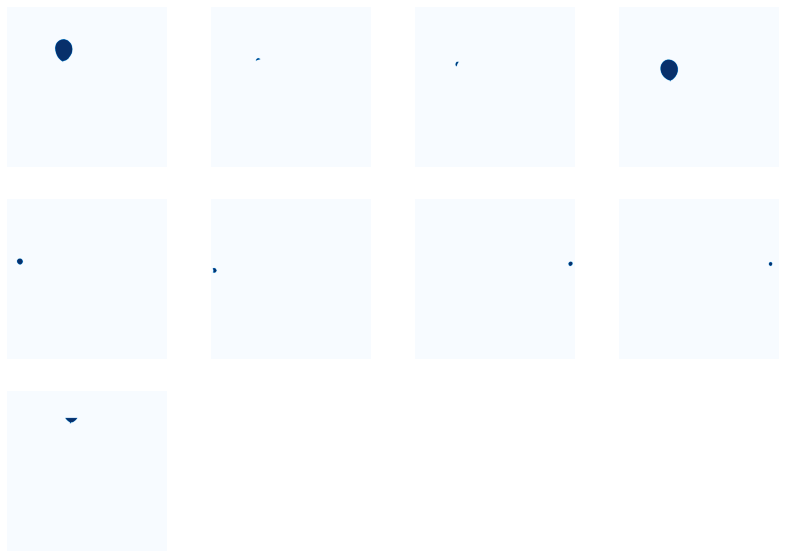

In [34]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

<br>

#### <font size=3>3.b Predicted Masks</font>

In [35]:
# Get predictions of mask head
mrcnn = model.run_graph(
          [image], 
          [("detections", model.keras_model.get_layer("mrcnn_detection").output),
           ("masks", model.keras_model.get_layer("mrcnn_mask").output),]
          )

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

# Build a Keras function to run parts of the computation graph

type(model) <class 'keras.engine.training.Model'>
model.trainable:  True
model.uses_learning_phase:  False
type(model.uses_learning_phase):  <class 'bool'>
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

inputs:  [<tf.Tensor 'input_image:0' shape=(?, ?, ?, 3) dtype=float32>, <tf.Tensor 'input_image_meta:0' shape=(?, 14) dtype=float32>, <tf.Tensor 'input_anchors:0' shape=(?, ?, 4) dtype=float32>]


# Run inference

model.trainable:  True
model.uses_learning_phase:  False
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

type(model_in):  <class 'list'>
len(model_in):  3
model_in[0].shape:  (1, 1024, 1024, 3)
model_in[1].shape:  (1, 14)
model_in[2].shape:  (1, 261888, 4)



detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
4 detect

<br>

In [36]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (4, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (4, 1024, 1024)       min:    0.00000  max:    1.00000  bool


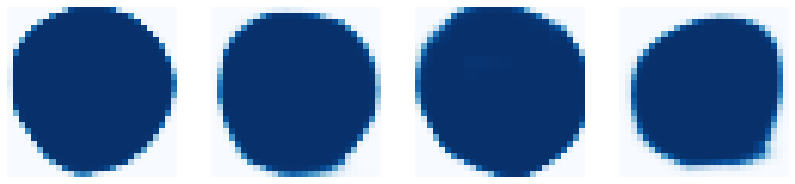

In [37]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

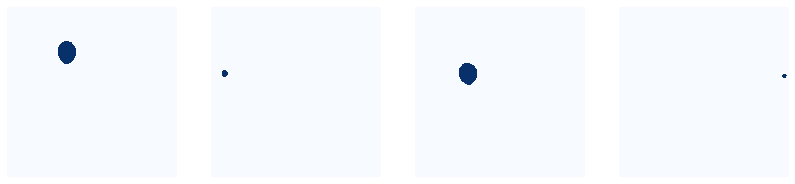

In [38]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

<br>
<br>
<br>

#### <font size=3>Visualize Activations</font>

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [39]:
# Get activations of a few sample layers
activations = model.run_graph(
    [image], 
    [("input_image", tf.identity(model.keras_model.get_layer("input_image").output)),
     ("res2c_out", model.keras_model.get_layer("res2c_out").output),
     ("res3c_out", model.keras_model.get_layer("res3c_out").output),
     ("res4w_out", model.keras_model.get_layer("res4w_out").output), # for resnet100
     ("rpn_bbox",  model.keras_model.get_layer("rpn_bbox").output),
     ("roi",       model.keras_model.get_layer("ROI").output),]
    )

# Build a Keras function to run parts of the computation graph

type(model) <class 'keras.engine.training.Model'>
model.trainable:  True
model.uses_learning_phase:  False
type(model.uses_learning_phase):  <class 'bool'>
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

inputs:  [<tf.Tensor 'input_image:0' shape=(?, ?, ?, 3) dtype=float32>, <tf.Tensor 'input_image_meta:0' shape=(?, 14) dtype=float32>, <tf.Tensor 'input_anchors:0' shape=(?, ?, 4) dtype=float32>]


# Run inference

model.trainable:  True
model.uses_learning_phase:  False
K.learning_phase():  Tensor("keras_learning_phase:0", shape=(), dtype=bool)

type(model_in):  <class 'list'>
len(model_in):  3
model_in[0].shape:  (1, 1024, 1024, 3)
model_in[1].shape:  (1, 14)
model_in[2].shape:  (1, 261888, 4)



input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   32.37488  float32
res3c_ou

<br>

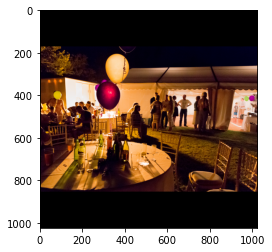

In [40]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

<br>

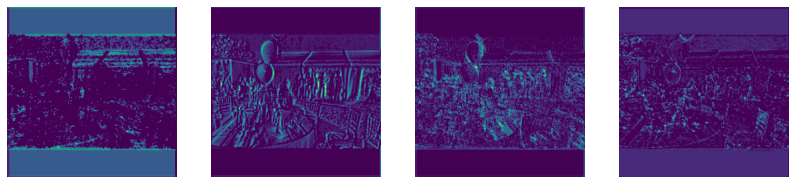

In [41]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), 
               cols=4)

<br>
<br>
<br>

<br>
<br>

#### <font size=3 color=blue>****</font>
##### <font size=3></font>
#### <font size=3></font>